# ***1. Basic Image Retrieval***

In [1]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt


# **Processing Data**

In [1]:
!gdown 1_lEyFskFlqAscF_6O8Fsd1Oo4O17oS4u
!unzip -q data.zip
!rm data.zip

Downloading...
From (original): https://drive.google.com/uc?id=1_lEyFskFlqAscF_6O8Fsd1Oo4O17oS4u
From (redirected): https://drive.google.com/uc?id=1_lEyFskFlqAscF_6O8Fsd1Oo4O17oS4u&confirm=t&uuid=43bc301f-6202-4795-ab77-bb0192a32a90
To: /content/data.zip
100% 76.1M/76.1M [00:01<00:00, 69.7MB/s]


In [3]:
ROOT = "data"
CLASS_NAME = sorted(list(os.listdir(f"{ROOT}/train")))
print(CLASS_NAME)


['African_crocodile', 'American_egret', 'Doberman', 'Lakeland_terrier', 'Orange_easy', 'Rhodesian_ridgeback', 'ambulance', 'apiary', 'bannister', 'barn_spider', 'basketball', 'black_widow', 'brain_coral', 'bullet_train', 'can_opener', 'capuchin', 'car_mirror', 'carousel', 'castle', 'china_cabinet', 'cliff_dwelling', 'comic_book', 'conch', 'cornet', 'dugong', 'electric_locomotive', 'flamingo', 'flatworm', 'goldfish', 'grocery_store', 'guillotine', 'half_track', 'hen-of-the-woods', 'horizontal_bar', 'killer_whale', 'kit_fox', 'knee_pad', 'lion', 'loudspeaker', 'lynx', 'magpie', 'meat_loaf', 'mixing_bowl', 'parachute', 'pizza', 'ram', 'red-backed_sandpiper', 'ruffed_grouse', 'safety_pin', 'scabbard', 'screen', 'steam_locomotive', 'steel_arch_bridge', 'theater_curtain', 'traffic_light', 'triceratops', 'vine_snake', 'warplane', 'white_stork', 'yawl']


In [28]:
def read_image_from_path(path, size):
    im = Image.open(path).convert("RGB").resize(size)
    return np.array(im)

def folder_to_array(folder, size):
  list_dir = [folder + "/" + name for name in os.listdir(folder)]
  images_np = np.zeros(shape=(len(list_dir), *size, 3))
  image_path = []
  for i, path in enumerate(list_dir):
    images_np[i] = read_image_from_path(path, size)
    image_path.append(path)
  image_path = np.array(image_path)
  return images_np, image_path



# **Absolute Difference**

In [11]:
def absolute_difference(query, data):
  axis_batch_size = tuple(range(1, len(data.shape)))
  # Return the mean absolute difference to get a single score for each comparison
  return np.sum(np.abs(data - query), axis=axis_batch_size)

def get_L1_score(root_img_path, query_img_path, size):
  query = read_image_from_path(query_img_path, size)
  ls_path_score = []
  for folder in os.listdir(root_img_path):
    if folder in CLASS_NAME:
      path = root_img_path + folder
      images_np, images_path = folder_to_array(path, size)
      rates = absolute_difference(query, images_np)
      ls_path_score.extend(list(zip(images_path, rates)))
  return query, ls_path_score

def plot_results(query, ls_path_score):
  # Show query
  plt.imshow(query)
  plt.title("Query Image")
  plt.show()

  # Show to the result
  # Find the index of the min difference
  index_match = np.argmin(np.array(ls_path_score)[:, 1].astype(float)) # Convert scores to float before finding the minimum
  # Convert this image to array
  path_score = read_image_from_path(ls_path_score[index_match][0], size) # Access the path correctly

  # Then show it
  plt.imshow(path_score)
  plt.title("Match Image")
  plt.show()

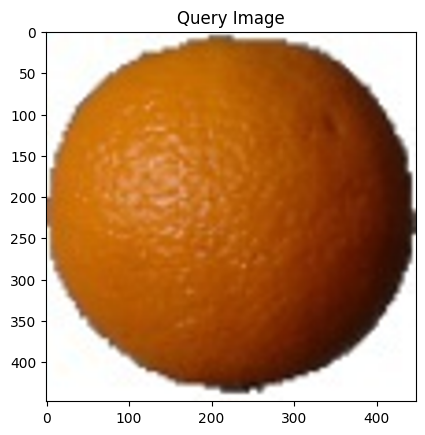

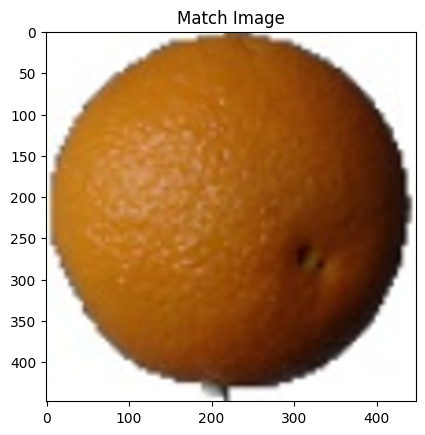

In [12]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_L1_score(root_img_path, query_path, size)
plot_results(query, ls_path_score)

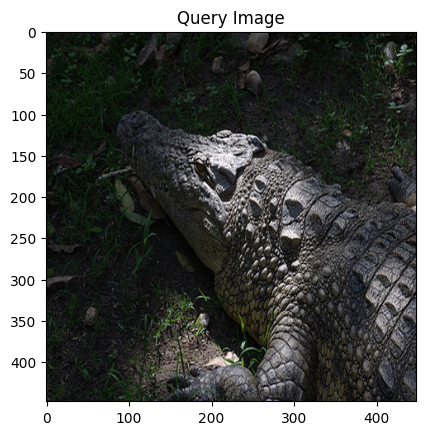

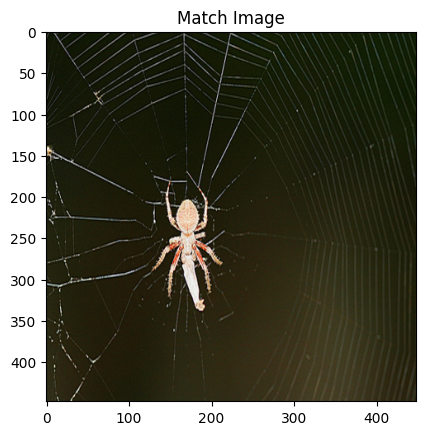

In [13]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_L1_score(root_img_path, query_path, size)
plot_results(query, ls_path_score)

# **Mean Square Difference**

In [51]:
def mean_square_difference(query, data):
  axis_batch_size = tuple(range(1, len(data.shape)))
  # Return the mean absolute difference to get a single score for each comparison
  return np.mean((data-query)**2, axis=axis_batch_size)

def get_L2_score(root_img_path, query_img_path, size):
  query = read_image_from_path(query_img_path, size)
  ls_path_score = []
  for folder in os.listdir(root_img_path):
    if folder in CLASS_NAME:
      path = root_img_path + folder
      images_np, images_path = folder_to_array(path, size)
      rates = mean_square_difference(query, images_np)
      ls_path_score.extend(list(zip(images_path, rates)))
  return query, ls_path_score

def plot_results(query, ls_path_score):
  # Show query
  plt.imshow(query)
  plt.title("Query Image")
  plt.show()

  # Show to the result
  # Find the index of the min difference
  index_match = np.argmin(np.array(ls_path_score)[:, 1].astype(float)) # Convert scores to float before finding the minimum
  # Convert this image to array
  path_score = read_image_from_path(ls_path_score[index_match][0], size) # Access the path correctly

  # Then show it
  plt.imshow(path_score)
  plt.title("Match Image")
  plt.show()

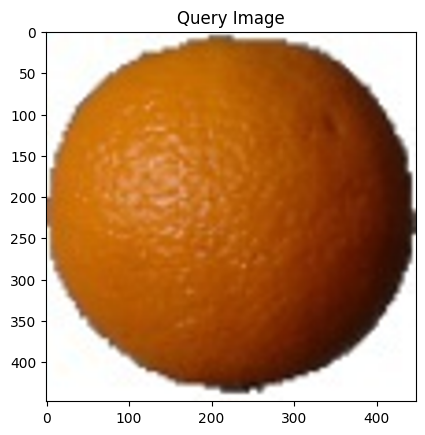

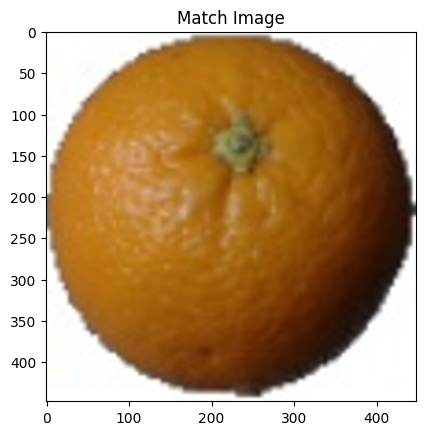

In [52]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_L2_score(root_img_path, query_path, size)
plot_results(query, ls_path_score)

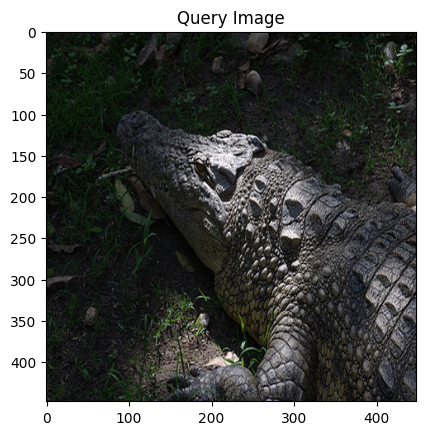

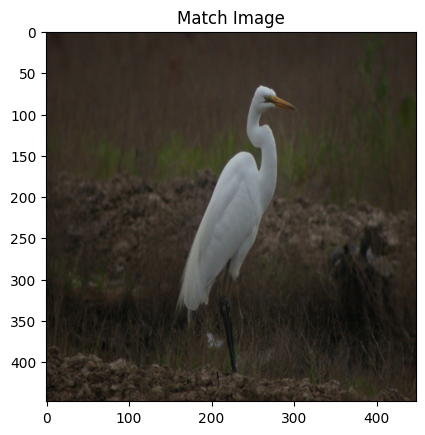

In [53]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_L2_score(root_img_path, query_path, size)
plot_results(query, ls_path_score)

# **Cosine Similarity**

In [69]:
def cosine_similarity(query, data):
  axis_batch_size = tuple(range(1, len(data.shape)))
  query_norm = np.sqrt(np.sum(query**2))
  data_norm = np.sqrt(np.sum(data**2, axis=axis_batch_size))
  return np.sum(data * query, axis=axis_batch_size) / (query_norm * data_norm + np.finfo(float).eps)

def get_cosine_similarity_score(root_img_path, query_img_path, size):
  query = read_image_from_path(query_img_path, size)
  ls_path_score = []
  for folder in os.listdir(root_img_path):
    if folder in CLASS_NAME:
      path = root_img_path + folder
      images_np, images_path = folder_to_array(path, size)
      rates = cosine_similarity(query, images_np)
      ls_path_score.extend(list(zip(images_path, rates)))
  return query, ls_path_score

def plot_results(query, ls_path_score):

  # Show query
  plt.imshow(query)
  plt.title("Query Image")
  plt.show()

  # Show to the result
  # Find the index of the min difference
  index_match = np.argmax(np.array(ls_path_score)[:, 1].astype(float)) # Convert scores to float before finding the minimum
  # Convert this image to array
  path_score = read_image_from_path(ls_path_score[index_match][0], size) # Access the path correctly

  # Then show it
  plt.imshow(path_score)
  plt.title("Match Image")
  plt.show()


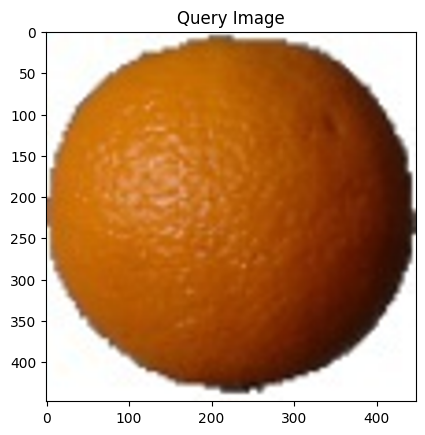

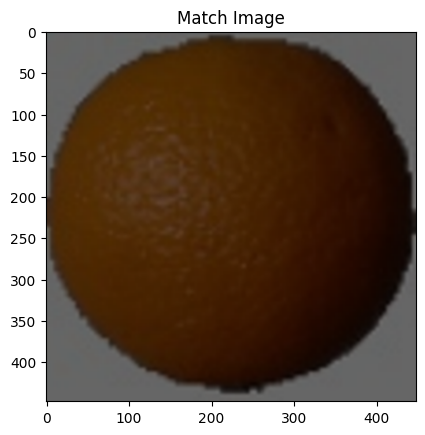

In [70]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score(root_img_path, query_path, size)
plot_results(query, ls_path_score)

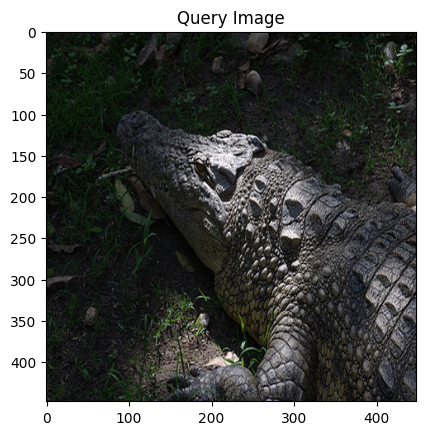

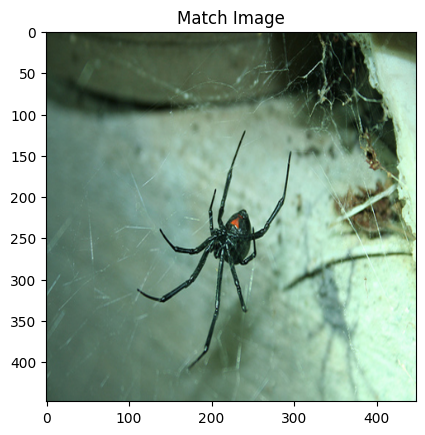

In [71]:
root_img_path =f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score(root_img_path, query_path, size)
plot_results(query, ls_path_score)

# **Correlation Coefficient**

In [72]:
def correlation_coefficient(query, data):
  axis_batch_size = tuple(range(1, len(data.shape)))
  query_mean = np.mean(query)
  data_mean = data - np.mean(data, axis=axis_batch_size, keepdims=True)
  query_norm = np.sqrt(np.sum(query**2))
  data_norm = np.sqrt(np.sum(data_mean**2, axis=axis_batch_size))

  return np.sum(data_mean * query, axis=axis_batch_size) / (query_norm * data_norm + np.finfo(float).eps)

def get_correlation_coefficient_score(root_img_path, query_img_path, size):
  query = read_image_from_path(query_img_path, size)
  ls_path_score = []
  for folder in os.listdir(root_img_path):
    if folder in CLASS_NAME:
      path = root_img_path + folder
      images_np, images_path = folder_to_array(path, size)
      rates = correlation_coefficient(query, images_np)
      ls_path_score.extend(list(zip(images_path, rates)))
  return query, ls_path_score

def plot_results(query, ls_path_score):

  # Show query
  plt.imshow(query)
  plt.title("Query Image")
  plt.show()

  # Show to the result
  # Find the index of the min difference
  index_match = np.argmax(np.array(ls_path_score)[:, 1].astype(float)) # Convert scores to float before finding the minimum
  # Convert this image to array
  path_score = read_image_from_path(ls_path_score[index_match][0], size) # Access the path correctly

  # Then show it
  plt.imshow(path_score)
  plt.title("Match Image")
  plt.show()

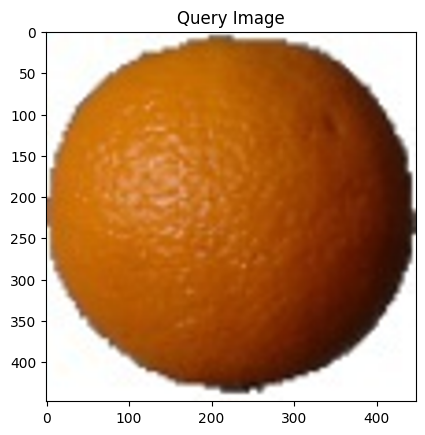

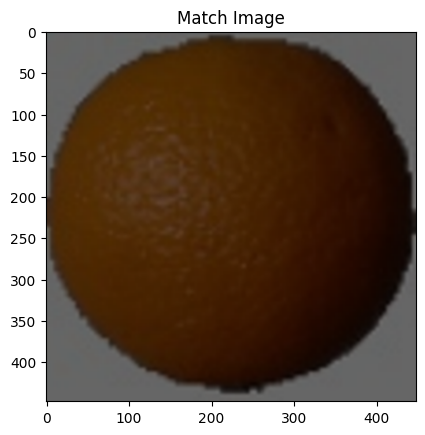

In [73]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(root_img_path, query_path, size)
plot_results(query, ls_path_score)

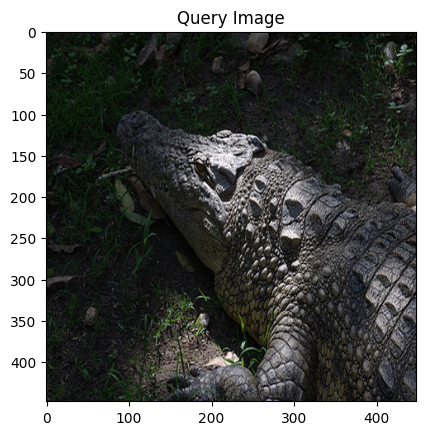

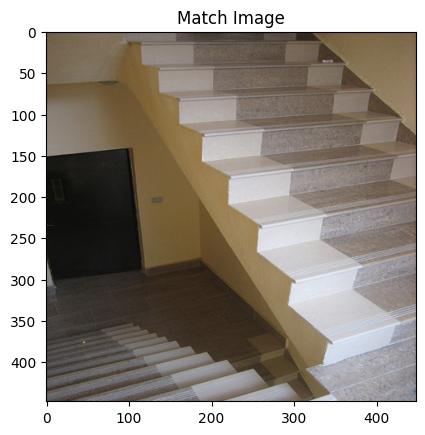

In [74]:
root_img_path =f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(root_img_path, query_path, size)
plot_results(query, ls_path_score)

# ***2. Image Retrival with Petrained Deep Learning Model***

In [ ]:
!pip install chromadb
!pip install open-clip-torch

In [6]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import chromadb
from chromadb.utils.embedding_functions import OpenCLIPEmbeddingFunction

# **Processing data**

In [7]:
embedding_function = OpenCLIPEmbeddingFunction()

# Convert image to ndarray
def get_single_image_embedding(image):
  embedding = embedding_function._encode_image(image=image)
  return np.array(embedding)

def read_image_from_path(path, size):
    im = Image.open(path).convert("RGB").resize(size)
    return np.array(im)

def folder_to_array(folder, size):
  list_dir = [folder + "/" + name for name in os.listdir(folder)]
  images_np = np.zeros(shape=(len(list_dir), *size, 3))
  image_path = []
  for i, path in enumerate(list_dir):
    images_np[i] = read_image_from_path(path, size)
    image_path.append(path)
  image_path = np.array(image_path)
  return images_np, image_path

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


open_clip_pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

# **Absolute Difference**

In [21]:
def absolute_difference2(query, data):
  axis_batch_size = tuple(range(1, len(data.shape)))
  # Return the mean absolute difference to get a single score for each comparison
  return np.sum(np.abs(data - query), axis=axis_batch_size)

def get_L1_score2(root_img_path, query_path, size):
  query = read_image_from_path(query_path, size)
  query_embedding = get_single_image_embedding(query)
  ls_path_score = []
  for folder in os.listdir(root_img_path):
    if folder in CLASS_NAME:
      path = root_img_path + folder
      images_np, images_path = folder_to_array(path, size)
      embedding_list = []
      # Iterate over the indices directly
      for idx_img in range(images_np.shape[0]):
        embeddings = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
        embedding_list.append(embeddings)
      rates = absolute_difference2(query_embedding, np.stack(embedding_list))
      ls_path_score.extend(list(zip(images_path, rates)))
  return query, ls_path_score

def plot_results2(query, ls_path_score):
  # Show query
  plt.imshow(query)
  plt.title("Query Image")
  plt.show()

  # Show to the result
  # Find the index of the min difference
  scores = np.array(ls_path_score)[:, 1].astype(float)
  indices_match = np.argsort(scores)[:5] # Sort the scores and get the top 5 indices

  # Loop through the indices and display the images
  No = 0
  for idx in indices_match:
    No += 1
    image_path = ls_path_score[idx][0]
    path_score = read_image_from_path(image_path, size)
    plt.imshow(path_score)
    plt.title(f"Match Image {No}")
    plt.show()


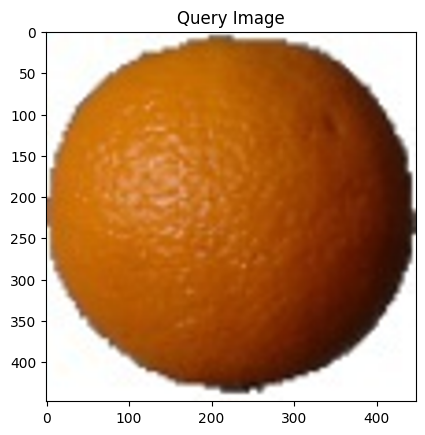

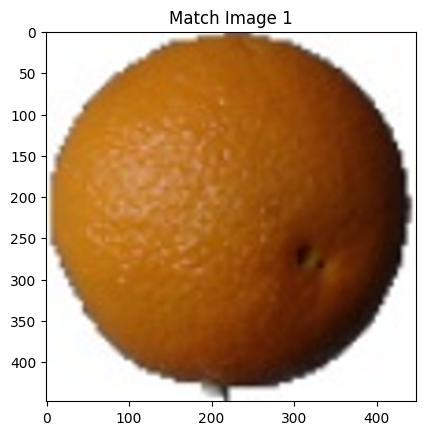

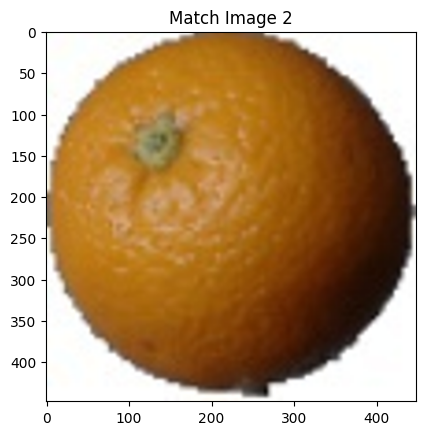

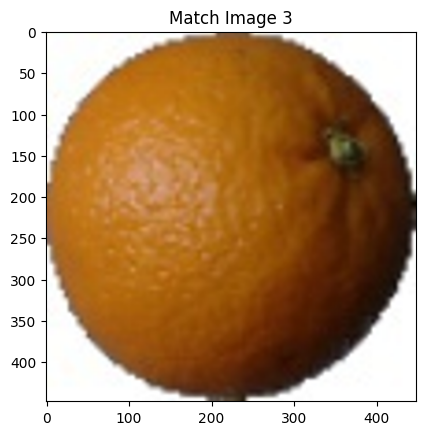

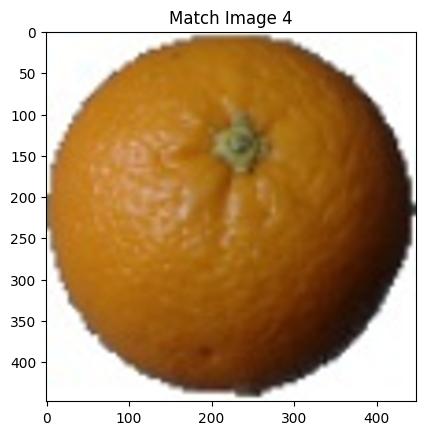

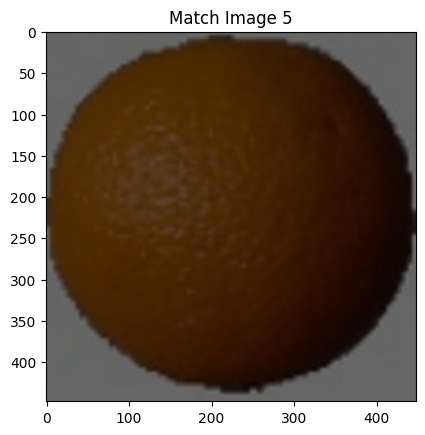

In [28]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_L1_score2(root_img_path, query_path, size)
plot_results2(query, ls_path_score)

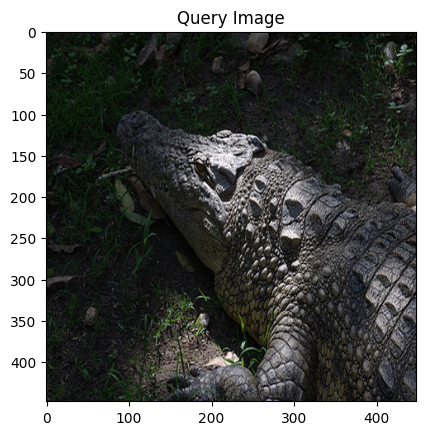

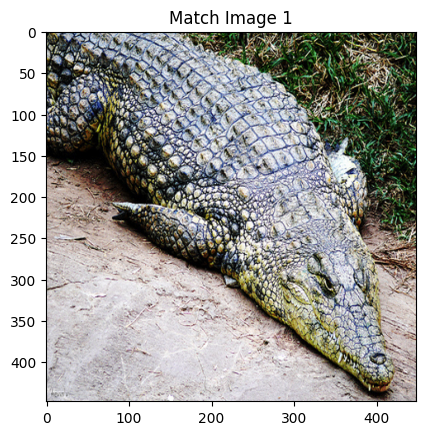

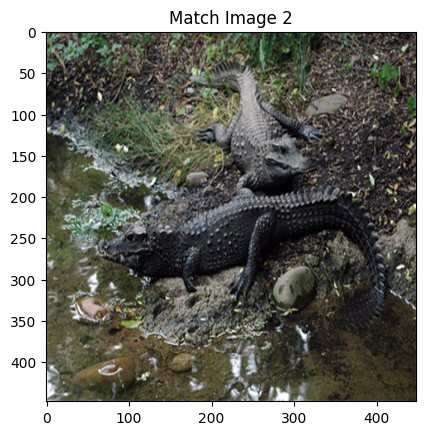

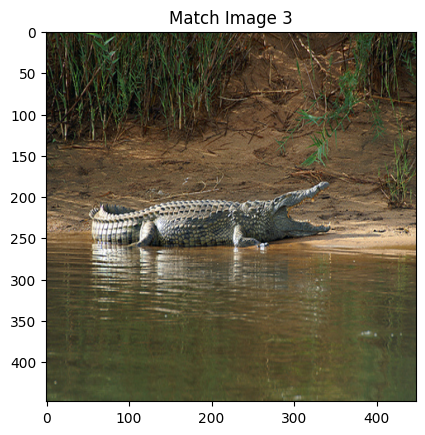

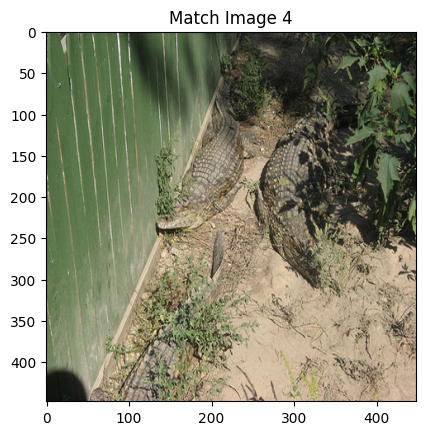

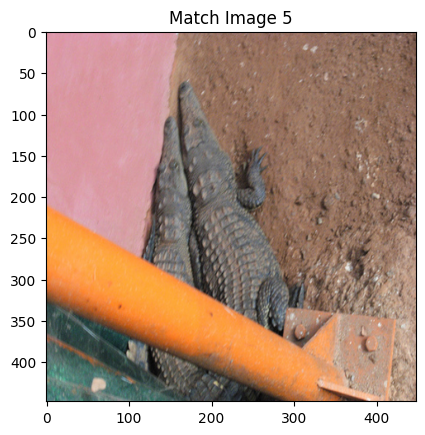

In [29]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_L1_score2(root_img_path, query_path, size)
plot_results2(query, ls_path_score)

# **Mean Square Diference**

In [26]:
def mean_square_difference2(query, data):
  axis_batch_size = tuple(range(1, len(data.shape)))
  # Return the mean absolute difference to get a single score for each comparison
  return np.mean((data-query)**2, axis=axis_batch_size)

def get_L2_score2(root_img_path, query_path, size):
  query = read_image_from_path(query_path, size)
  query_embedding = get_single_image_embedding(query)
  ls_path_score = []
  for folder in os.listdir(root_img_path):
    if folder in CLASS_NAME:
      path = root_img_path + folder
      images_np, images_path = folder_to_array(path, size)
      embedding_list = []
      # Iterate over the indices directly
      for idx_img in range(images_np.shape[0]):
        embeddings = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
        embedding_list.append(embeddings)
      rates = mean_square_difference2(query_embedding, np.stack(embedding_list))
      ls_path_score.extend(list(zip(images_path, rates)))
  return query, ls_path_score

def plot_results2(query, ls_path_score):
  # Show query
  plt.imshow(query)
  plt.title("Query Image")
  plt.show()

  # Show to the result
  # Find the index of the min difference
  scores = np.array(ls_path_score)[:, 1].astype(float)
  indices_match = np.argsort(scores)[:5] # Sort the scores and get the top 5 indices

  # Loop through the indices and display the images
  No = 0
  for idx in indices_match:
    No += 1
    image_path = ls_path_score[idx][0]
    path_score = read_image_from_path(image_path, size)
    plt.imshow(path_score)
    plt.title(f"Match Image {No}")
    plt.show()

In [ ]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_L2_score2(root_img_path, query_path, size)
plot_results2(query, ls_path_score)

In [ ]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_L2_score2(root_img_path, query_path, size)
plot_results2(query, ls_path_score)

# **Cosine Similarity**

In [35]:
def cosine_similarity2(query, data):
  axis_batch_size = tuple(range(1, len(data.shape)))
  query_norm = np.sqrt(np.sum(query**2))
  data_norm = np.sqrt(np.sum(data**2, axis=axis_batch_size))
  return np.sum(data * query, axis=axis_batch_size) / (query_norm * data_norm + np.finfo(float).eps)

def get_Cosine_Similarity_score2(root_img_path, query_path, size):
  query = read_image_from_path(query_path, size)
  query_embedding = get_single_image_embedding(query)
  ls_path_score = []
  for folder in os.listdir(root_img_path):
    if folder in CLASS_NAME:
      path = root_img_path + folder
      images_np, images_path = folder_to_array(path, size)
      embedding_list = []
      # Iterate over the indices directly
      for idx_img in range(images_np.shape[0]):
        embeddings = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
        embedding_list.append(embeddings)
      rates = cosine_similarity2(query_embedding, np.stack(embedding_list))
      ls_path_score.extend(list(zip(images_path, rates)))
  return query, ls_path_score

def plot_results2(query, ls_path_score):
  # Show query
  plt.imshow(query)
  plt.title("Query Image")
  plt.show()

  # Show to the result
  # Find the index of the min difference
  scores = np.array(ls_path_score)[:, 1].astype(float)
  indices_match = np.argsort(scores)[:5] # Sort the scores and get the top 5 indices

  # Loop through the indices and display the images
  No = 0
  for idx in indices_match:
    No += 1
    image_path = ls_path_score[idx][0]
    path_score = read_image_from_path(image_path, size)
    plt.imshow(path_score)
    plt.title(f"Match Image {No}")
    plt.show()

In [ ]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_Cosine_Similarity_score2(root_img_path, query_path, size)
plot_results2(query, ls_path_score)

In [ ]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_Cosine_Similarity_score2(root_img_path, query_path, size)
plot_results2(query, ls_path_score)

# **Correlation Coefficient**

In [36]:
def correlation_coefficient2(query, data):
  axis_batch_size = tuple(range(1, len(data.shape)))
  query_mean = np.mean(query)
  data_mean = data - np.mean(data, axis=axis_batch_size, keepdims=True)
  query_norm = np.sqrt(np.sum(query**2))
  data_norm = np.sqrt(np.sum(data_mean**2, axis=axis_batch_size))

  return np.sum(data_mean * query, axis=axis_batch_size) / (query_norm * data_norm + np.finfo(float).eps)

def get_L1_score2(root_img_path, query_path, size):
  query = read_image_from_path(query_path, size)
  query_embedding = get_single_image_embedding(query)
  ls_path_score = []
  for folder in os.listdir(root_img_path):
    if folder in CLASS_NAME:
      path = root_img_path + folder
      images_np, images_path = folder_to_array(path, size)
      embedding_list = []
      # Iterate over the indices directly
      for idx_img in range(images_np.shape[0]):
        embeddings = get_single_image_embedding(images_np[idx_img].astype(np.uint8))
        embedding_list.append(embeddings)
      rates = correlation_coefficient2(query_embedding, np.stack(embedding_list))
      ls_path_score.extend(list(zip(images_path, rates)))
  return query, ls_path_score

def plot_results2(query, ls_path_score):
  # Show query
  plt.imshow(query)
  plt.title("Query Image")
  plt.show()

  # Show to the result
  # Find the index of the min difference
  scores = np.array(ls_path_score)[:, 1].astype(float)
  indices_match = np.argsort(scores)[:5] # Sort the scores and get the top 5 indices

  # Loop through the indices and display the images
  No = 0
  for idx in indices_match:
    No += 1
    image_path = ls_path_score[idx][0]
    path_score = read_image_from_path(image_path, size)
    plt.imshow(path_score)
    plt.title(f"Match Image {No}")
    plt.show()


In [ ]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_L1_score2(root_img_path, query_path, size)
plot_results2(query, ls_path_score)

In [ ]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_L1_score2(root_img_path, query_path, size)
plot_results2(query, ls_path_score)

# **Optimizing Retrieval Process**

In [10]:
def get_files_path(path):
  files_path = []
  for label in CLASS_NAME:
    label_path = path + "/" + label
    filenames = os.listdir(label_path)
    for filename in filenames:
      files_path.append(label_path + "/" + filename)
  return files_path

ROOT = "data"
CLASS_NAME = sorted(list(os.listdir(f"{ROOT}/train")))
data_path = f"{ROOT}/train/"
files_path = get_files_path(path=data_path)

In [11]:
import tqdm
from PIL import Image
import numpy as np

def add_embedding(collection, files_path):
  ids = []
  embeddings = []
  for id_filepath, filepath in tqdm.tqdm(enumerate(files_path)):
    ids.append(f"id_{id_filepath}")
    # Open the image and convert it to RGB format
    image = Image.open(filepath).convert('RGB')
    # Convert image to numpy array
    image_np = np.array(image)
    embedding = get_single_image_embedding(image=image_np) # Pass array to embedding function
    # Convert embedding to list before appending
    embeddings.append(embedding.tolist()) # Convert numpy array to list
  collection.add(
      embeddings=embeddings,
      ids=ids
  )

In [50]:
# Create a Chroma Client
chroma_client = chromadb.Client()

# Define HNSW_SPACE
HNSW_SPACE = "hnsw:space"

# Check if collection exists and get or create
l2_collection = chroma_client.get_or_create_collection(name="l2_collection", metadata={HNSW_SPACE: "l2"})

add_embedding(collection=l2_collection, files_path=files_path)

595it [02:25,  4.10it/s]


In [12]:
# Cosine Similarity Collection
# Create a Chroma Client
chroma_client = chromadb.Client()

# Define HNSW_SPACE
HNSW_SPACE = "hnsw:space"

# Create a collection
cosine_collection = chroma_client.get_or_create_collection(name="Cosine_collection",metadata={HNSW_SPACE: "cosine"})
add_embedding(collection=cosine_collection, files_path=files_path)


595it [03:15,  3.04it/s]


In [13]:
from sys import path
def search(image_path, collection, n_results):
  # Open image using PIL and convert to RGB
  image = Image.open(image_path).convert('RGB')
  # Convert image to numpy array
  image_np = np.array(image)

  query_embedding = get_single_image_embedding(image=image_np) # Pass numpy array to function
  # Convert the query embedding to a list of lists
  query_embedding_list = [query_embedding.tolist()]
  results = collection.query(
      query_embeddings=query_embedding_list, # Pass a list of lists as query embeddings
      n_results=n_results
  )
  return results

def plot_results_Optimize(image_path, files_path, results):
  fixed_size = (448, 448)
  # Show query
  # Open the image using PIL
  image = Image.open(image_path) # Open the image here
  plt.imshow(image) # Display the opened image
  plt.title("Query Image")
  plt.show()

  ids = results["ids"]

  # Flatten the list (if it is nested)
  flat_ids = [item for sublist in ids for item in sublist]

  # Extract the numbers from the ID names
  numbers = [int(id.split('_')[1]) for id in flat_ids]

  No = 0
  for idx in numbers:
    No += 1
    image_path = files_path[idx]
    path_score = read_image_from_path(image_path, fixed_size)
    plt.imshow(path_score)
    plt.title(f"Match Image {No}")
    plt.show()


data/test/American_egret/n02009912_2473.JPEG


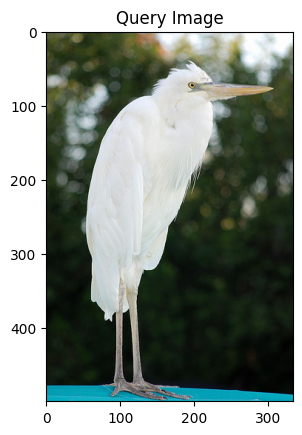

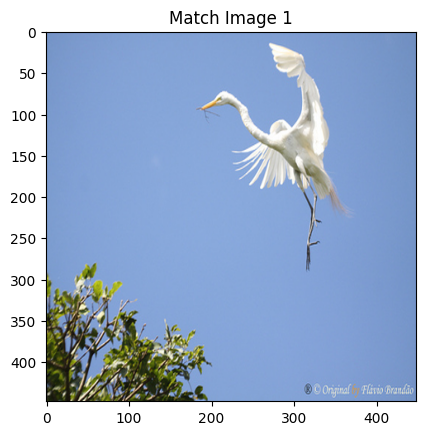

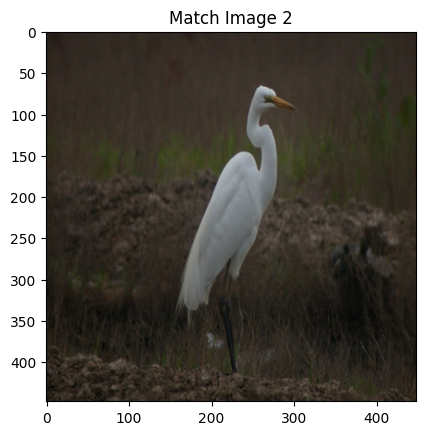

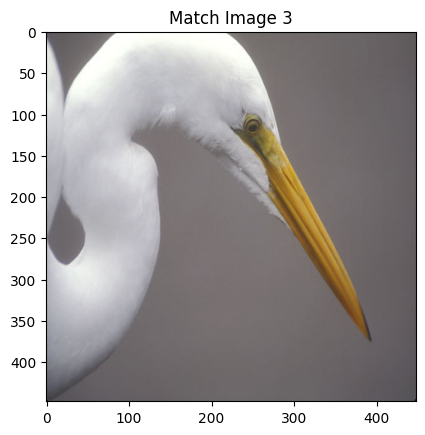

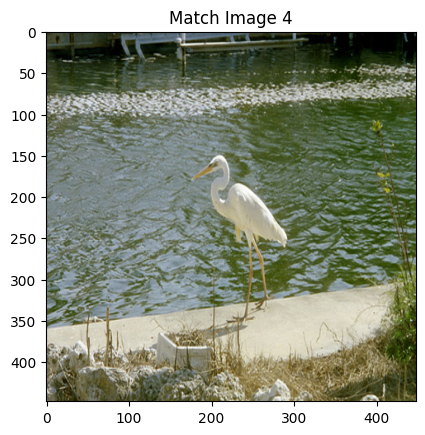

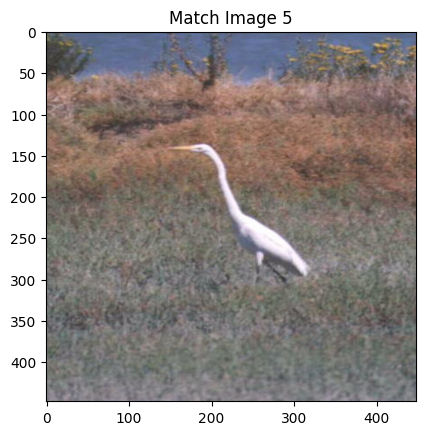

In [15]:
test_path = f"{ROOT}/test"
test_files_path = get_files_path(path=test_path)
test_path = test_files_path[1]
print(test_path)
l2_results = search(image_path=test_path, collection=l2_collection, n_results=5)
plot_results_Optimize(image_path=test_path, files_path=files_path, results=l2_results)

/content/data/test/safety_pin/n04127249_1320.JPEG


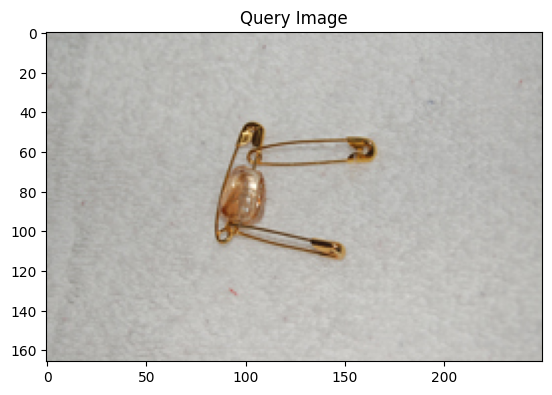

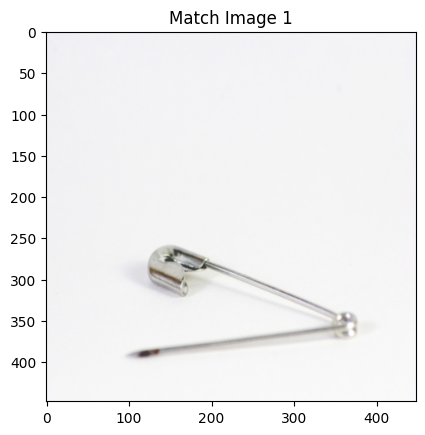

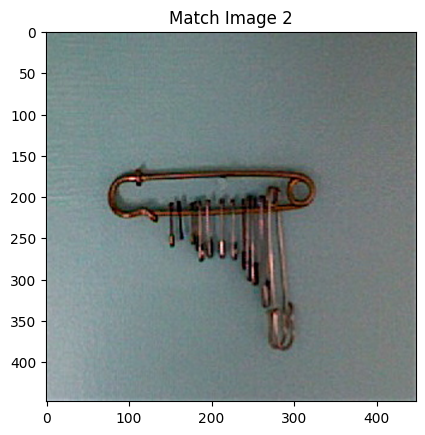

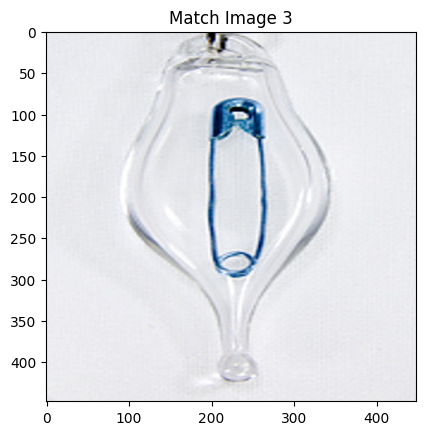

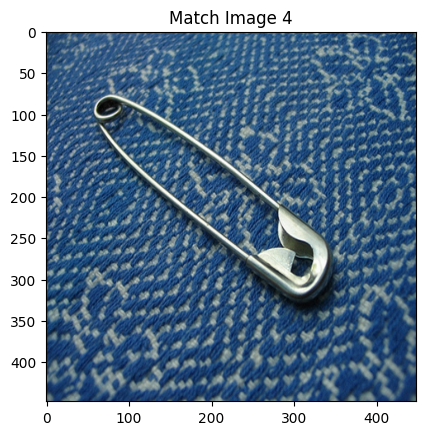

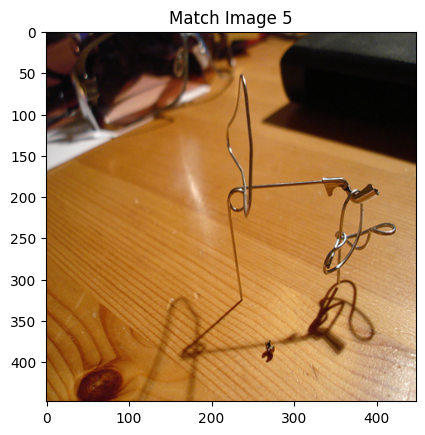

In [16]:
# test_path = f"{ROOT}/test"
# test_files_path = get_files_path(path=test_path)
test_path = "/content/data/test/safety_pin/n04127249_1320.JPEG"
print(test_path)
l2_results = search(image_path=test_path, collection=cosine_collection, n_results=5)
plot_results_Optimize(image_path=test_path, files_path=files_path, results=l2_results)